# Part 1

## Import modules

In [184]:
# import modules
import pandas as pd
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.ticker as ticker
import seaborn as sns
import plotly.express as px
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_absolute_error, mean_squared_error

sns.set_style("darkgrid")

%matplotlib inline

## Reading the data

The data has been gathered from this link - "https://github.com/CSSEGISandData/COVID-19". Thanks to John Hopkins university for providing the datasets to perform this data analysis.

In [185]:
COVID_CONFIRMED_URL = 'https://raw.githubusercontent.com/CSSEGISandData/COVID-19/master/csse_covid_19_data/csse_covid_19_time_series/time_series_covid19_confirmed_global.csv'
covid_confirmed = pd.read_csv(COVID_CONFIRMED_URL) # The Confirmed DataFrame
covid_confirmed.head()

,Province/State,Country/Region,Lat,Long,1/22/20,1/23/20,1/24/20,1/25/20,1/26/20,1/27/20,...,4/13/20,4/14/20,4/15/20,4/16/20,4/17/20,4/18/20,4/19/20,4/20/20,4/21/20,4/22/20
0,NaN,Afghanistan,33.0000,65.0000,0,0,0,0,0,0,...,665,714,784,840,906,933,996,1026,1092,1176
1,NaN,Albania,41.1533,20.1683,0,0,0,0,0,0,...,467,475,494,518,539,548,562,584,609,634
2,NaN,Algeria,28.0339,1.6596,0,0,0,0,0,0,...,1983,2070,2160,2268,2418,2534,2629,2718,2811,2910
3,NaN,Andorra,42.5063,1.5218,0,0,0,0,0,0,...,646,659,673,673,696,704,713,717,717,723
4,NaN,Angola,-11.2027,17.8739,0,0,0,0,0,0,...,19,19,19,19,19,24,24,24,24,25


In [186]:
COVID_RECOVERED_URL = 'https://raw.githubusercontent.com/CSSEGISandData/COVID-19/master/csse_covid_19_data/csse_covid_19_time_series/time_series_covid19_recovered_global.csv'
covid_recovered = pd.read_csv(COVID_RECOVERED_URL) # The Recovered DataFrame
covid_recovered.head()

,Province/State,Country/Region,Lat,Long,1/22/20,1/23/20,1/24/20,1/25/20,1/26/20,1/27/20,...,4/13/20,4/14/20,4/15/20,4/16/20,4/17/20,4/18/20,4/19/20,4/20/20,4/21/20,4/22/20
0,NaN,Afghanistan,33.0000,65.0000,0,0,0,0,0,0,...,32,40,43,54,99,112,131,135,150,166
1,NaN,Albania,41.1533,20.1683,0,0,0,0,0,0,...,232,248,251,277,283,302,314,327,345,356
2,NaN,Algeria,28.0339,1.6596,0,0,0,0,0,0,...,601,691,708,783,846,894,1047,1099,1152,1204
3,NaN,Andorra,42.5063,1.5218,0,0,0,0,0,0,...,128,128,169,169,191,205,235,248,282,309
4,NaN,Angola,-11.2027,17.8739,0,0,0,0,0,0,...,4,5,5,5,5,6,6,6,6,6


In [187]:
COVID_DEATHS_URL = 'https://raw.githubusercontent.com/CSSEGISandData/COVID-19/master/csse_covid_19_data/csse_covid_19_time_series/time_series_covid19_deaths_global.csv'
covid_deaths = pd.read_csv(COVID_DEATHS_URL) # The Deaths DataFrame
covid_deaths.head()

,Province/State,Country/Region,Lat,Long,1/22/20,1/23/20,1/24/20,1/25/20,1/26/20,1/27/20,...,4/13/20,4/14/20,4/15/20,4/16/20,4/17/20,4/18/20,4/19/20,4/20/20,4/21/20,4/22/20
0,NaN,Afghanistan,33.0000,65.0000,0,0,0,0,0,0,...,21,23,25,30,30,30,33,36,36,40
1,NaN,Albania,41.1533,20.1683,0,0,0,0,0,0,...,23,24,25,26,26,26,26,26,26,27
2,NaN,Algeria,28.0339,1.6596,0,0,0,0,0,0,...,313,326,336,348,364,367,375,384,392,402
3,NaN,Andorra,42.5063,1.5218,0,0,0,0,0,0,...,29,31,33,33,35,35,36,37,37,37
4,NaN,Angola,-11.2027,17.8739,0,0,0,0,0,0,...,2,2,2,2,2,2,2,2,2,2


## Data Cleaning

Most of the data here is clean and I shall mostly perform replacement of few country names('Mainland China' with 'China') and fill in the blanks.

In [188]:
# Replace the name 'Mainland China' with just 'China' is all the three DataFrames
covid_confirmed['Country/Region'].replace('Mainland China', 'China', inplace=True)
covid_deaths['Country/Region'].replace('Mainland China', 'China', inplace=True)
covid_recovered['Country/Region'].replace('Mainland China', 'China', inplace=True)

In [189]:
# Fill empty strings if there are no Province/State
covid_confirmed[['Province/State']] = covid_confirmed[['Province/State']].fillna('')
covid_confirmed.fillna(0, inplace=True)

covid_deaths[['Province/State']] = covid_deaths[['Province/State']].fillna('')
covid_deaths.fillna(0, inplace=True)

covid_recovered[['Province/State']] = covid_recovered[['Province/State']].fillna('')
covid_recovered.fillna(0, inplace=True)

Perform some checks:

In [190]:
covid_confirmed.isna().sum().sum()

0

In [191]:
covid_recovered.isna().sum().sum()

0

In [192]:
covid_deaths.isna().sum().sum()

0

## Data Analysis and Data Wrangling

The analysis starts with the worldwide impact of the coronavirus. (Need to create new columns, create intermediate DataFrames
,  and re-shape of the data. The process which is known as Data Wrangling)

In [193]:
# total count of the confirmed cases
covid_confirmed_count = covid_confirmed.iloc[:, 4:].sum().max()

covid_confirmed_count

2623413

In [194]:
# total count of the death cases
covid_deaths_count = covid_deaths.iloc[:, 4:].sum().max()

covid_deaths_count

183025

In [195]:
# total count of the recovered cases
covid_recovered_count = covid_recovered.iloc[:, 4:].sum().max()

covid_recovered_count

709694

Therefore, the Active case count = Confirmed - ( Deaths + Recovered )

In [196]:
world_df = pd.DataFrame({
    'confirmed': [covid_confirmed_count],
    'deaths': [covid_deaths_count],
    'recovered': [covid_recovered_count],
    'active': [covid_confirmed_count - covid_deaths_count - covid_recovered_count]
})

world_df

,confirmed,deaths,recovered,active
0,2623413,183025,709694,1730694


In [197]:
world_long_df = world_df.melt(value_vars=['active', 'deaths', 'recovered'], var_name="status", value_name="count")
world_long_df['upper'] = 'confirmed'
world_long_df

,status,count,upper
0,active,1730694,confirmed
1,deaths,183025,confirmed
2,recovered,709694,confirmed


In [198]:
# Plot the world_df DataFrame
world_df_plot = px.treemap(world_long_df, path=["upper", "status"], values="count",
                 color_discrete_sequence=['#fbff2b', '#59ff7a', '#ff4a26'],
                 template='plotly_dark')
world_df_plot.show()

### Worldwide over the time evolution analysis

In [199]:
# Daily confirmed cases
covid_worldwide_confirmed = covid_confirmed.iloc[:, 4:].sum(axis=0)
covid_worldwide_confirmed.head()

1/22/20     555
1/23/20     654
1/24/20     941
1/25/20    1434
1/26/20    2118
dtype: int64

In [200]:
# Daily death cases
covid_worldwide_deaths = covid_deaths.iloc[:, 4:].sum(axis=0)
covid_worldwide_deaths.head()

1/22/20    17
1/23/20    18
1/24/20    26
1/25/20    42
1/26/20    56
dtype: int64

In [201]:
# Daily recovered cases
covid_worldwide_recovered = covid_recovered.iloc[:, 4:].sum(axis=0)
covid_worldwide_recovered.head()

1/22/20    28
1/23/20    30
1/24/20    36
1/25/20    39
1/26/20    52
dtype: int64

In [202]:
# Daily Active Cases
covid_worldwide_active = covid_worldwide_confirmed - covid_worldwide_deaths - covid_worldwide_recovered

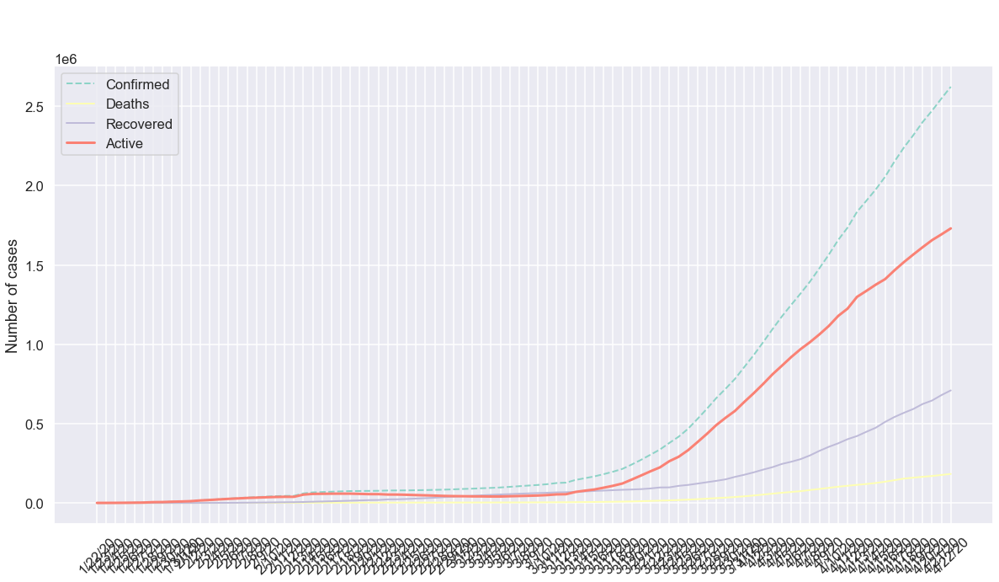

In [203]:
fig, ax = plt.subplots(figsize=(20, 10))
sns.lineplot(x=covid_worldwide_confirmed.index, y=covid_worldwide_confirmed, sort=False, linewidth=2) # Confirmed
sns.lineplot(x=covid_worldwide_deaths.index, y=covid_worldwide_deaths, sort=False, linewidth=2) # Deaths
sns.lineplot(x=covid_worldwide_recovered.index, y=covid_worldwide_recovered, sort=False, linewidth=2) # Recovered
sns.lineplot(x=covid_worldwide_active.index, y=covid_worldwide_active, sort=False, linewidth=3) # Active
ax.lines[0].set_linestyle("--") # Dashed lines for the confirmed cases
plt.suptitle("COVID-19 Time Series Evolution", fontsize=25, fontweight='bold', color='white')
plt.xticks(rotation=45)
plt.ylabel('Number of cases')
ax.legend(['Confirmed', 'Deaths', 'Recovered', 'Active'])
plt.show()

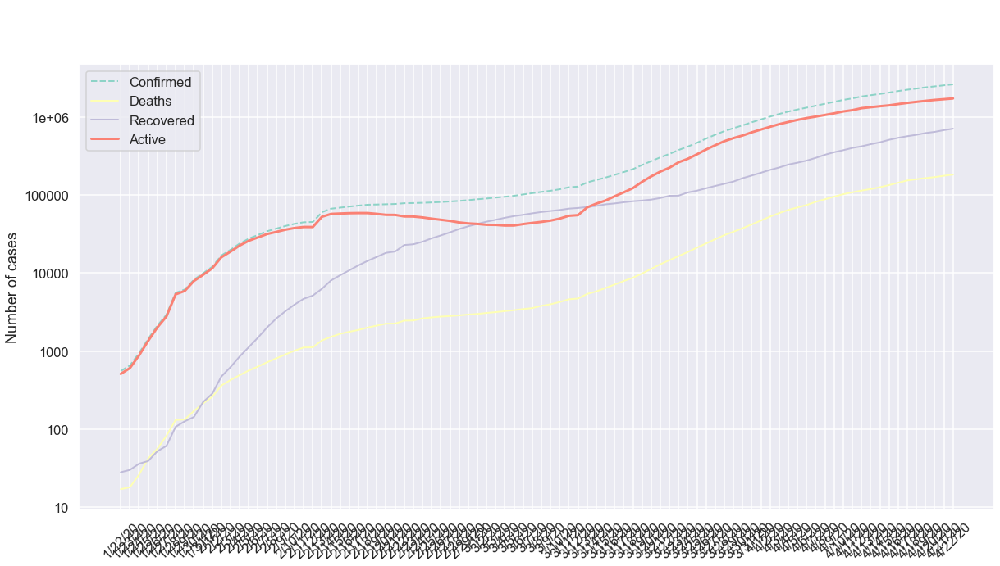

In [204]:
# Logarithmic Scale
fig, ax = plt.subplots(figsize=(20, 10))
ax.set(yscale="log")
ax.yaxis.set_major_formatter(ticker.FuncFormatter(lambda y, _: '{:g}'.format(y)))
sns.lineplot(x=covid_worldwide_confirmed.index, y=covid_worldwide_confirmed, sort=False, linewidth=2)
sns.lineplot(x=covid_worldwide_deaths.index, y=covid_worldwide_deaths, sort=False, linewidth=2)
sns.lineplot(x=covid_worldwide_recovered.index, y=covid_worldwide_recovered, sort=False, linewidth=2)
sns.lineplot(x=covid_worldwide_active.index, y=covid_worldwide_active, sort=False, linewidth=3)
ax.lines[0].set_linestyle("--") # Dashed lines for the confirmed cases
plt.suptitle("COVID-19 worldwide cases over the time", fontsize=25, fontweight='bold', color='white')
plt.title("(logarithmic scale)", color='white')
plt.xticks(rotation=45)
plt.ylabel('Number of cases')
ax.legend(['Confirmed', 'Deaths', 'Recovered', 'Active'])
plt.show()

### Recovery and mortality rate over time

In [205]:
# Rate
world_rate_df = pd.DataFrame({
    'confirmed': covid_worldwide_confirmed,
    'deaths': covid_worldwide_deaths,
    'recovered': covid_worldwide_recovered,
    'active': covid_worldwide_active
}, index=covid_worldwide_confirmed.index)

world_rate_df.tail()

,confirmed,deaths,recovered,active
4/18/20,2317758,159509,592319,1565930
4/19/20,2401101,165043,623903,1612155
4/20/20,2472258,169985,645738,1656535
4/21/20,2549293,176582,679819,1692892
4/22/20,2623413,183025,709694,1730694


In [206]:
world_rate_df['recovered / 100 confirmed'] = world_rate_df['recovered'] / world_rate_df['confirmed'] * 100 # Patients recovered to confirmedx100 ratio
world_rate_df['deaths / 100 confirmed'] = world_rate_df['deaths'] / world_rate_df['confirmed'] * 100 # Patients deaths to confirmedx100 ratio
world_rate_df['date'] = world_rate_df.index
world_rate_df.tail()

,confirmed,deaths,recovered,active,recovered / 100 confirmed,deaths / 100 confirmed,date
4/18/20,2317758,159509,592319,1565930,25.555688,6.882039,4/18/20
4/19/20,2401101,165043,623903,1612155,25.984038,6.873638,4/19/20
4/20/20,2472258,169985,645738,1656535,26.119361,6.875698,4/20/20
4/21/20,2549293,176582,679819,1692892,26.666962,6.926705,4/21/20
4/22/20,2623413,183025,709694,1730694,27.052317,6.976599,4/22/20


In [207]:
world_rate_long_df = world_rate_df.melt(id_vars="date",
                                        value_vars=['recovered / 100 confirmed', 'deaths / 100 confirmed'],
                                        var_name="status",
                                        value_name="ratio")
world_rate_long_df

,date,status,ratio
0,1/22/20,recovered / 100 confirmed,5.045045
1,1/23/20,recovered / 100 confirmed,4.587156
2,1/24/20,recovered / 100 confirmed,3.825717
3,1/25/20,recovered / 100 confirmed,2.719665
4,1/26/20,recovered / 100 confirmed,2.455146
...,...,...,...
179,4/18/20,deaths / 100 confirmed,6.882039
180,4/19/20,deaths / 100 confirmed,6.873638
181,4/20/20,deaths / 100 confirmed,6.875698
182,4/21/20,deaths / 100 confirmed,6.926705


In [208]:
fig = px.line(world_rate_long_df, x="date", y="ratio", color='status', log_y=True, 
              title='Recovery and Mortality rate over the time',
              color_discrete_sequence=['#00FF5E', '#FF0000'],
              template='plotly_dark')

fig.show()

### Visualizing worldwide COVID-19 cases in a map

In [209]:
covid_confirmed_agg = covid_confirmed.groupby('Country/Region').sum().reset_index()

In [210]:
covid_confirmed_agg.loc[:, ['Lat', 'Long']] = covid_confirmed.groupby('Country/Region').mean().reset_index().loc[:, ['Lat', 'Long']]
covid_confirmed_agg

,Country/Region,Lat,Long,1/22/20,1/23/20,1/24/20,1/25/20,1/26/20,1/27/20,1/28/20,...,4/13/20,4/14/20,4/15/20,4/16/20,4/17/20,4/18/20,4/19/20,4/20/20,4/21/20,4/22/20
0,Afghanistan,33.000000,65.000000,0,0,0,0,0,0,0,...,665,714,784,840,906,933,996,1026,1092,1176
1,Albania,41.153300,20.168300,0,0,0,0,0,0,0,...,467,475,494,518,539,548,562,584,609,634
2,Algeria,28.033900,1.659600,0,0,0,0,0,0,0,...,1983,2070,2160,2268,2418,2534,2629,2718,2811,2910
3,Andorra,42.506300,1.521800,0,0,0,0,0,0,0,...,646,659,673,673,696,704,713,717,717,723
4,Angola,-11.202700,17.873900,0,0,0,0,0,0,0,...,19,19,19,19,19,24,24,24,24,25
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
180,West Bank and Gaza,31.952200,35.233200,0,0,0,0,0,0,0,...,308,308,374,374,402,418,437,449,466,474
181,Western Sahara,24.215500,-12.885800,0,0,0,0,0,0,0,...,6,6,6,6,6,6,6,6,6,6
182,Yemen,15.552727,48.516388,0,0,0,0,0,0,0,...,1,1,1,1,1,1,1,1,1,1
183,Zambia,-15.416700,28.283300,0,0,0,0,0,0,0,...,45,45,48,48,52,57,61,65,70,74


In [211]:
MIN_CASES = 100 # involve only the cases where number is more than 100
covid_confirmed_agg = covid_confirmed_agg[covid_confirmed_agg.iloc[:, 3:].max(axis=1) > MIN_CASES]

Convert data from wide to long format:

In [212]:
print(covid_confirmed_agg.shape)
covid_confirmed_agg.head()

(132, 95)


,Country/Region,Lat,Long,1/22/20,1/23/20,1/24/20,1/25/20,1/26/20,1/27/20,1/28/20,...,4/13/20,4/14/20,4/15/20,4/16/20,4/17/20,4/18/20,4/19/20,4/20/20,4/21/20,4/22/20
0,Afghanistan,33.0000,65.0000,0,0,0,0,0,0,0,...,665,714,784,840,906,933,996,1026,1092,1176
1,Albania,41.1533,20.1683,0,0,0,0,0,0,0,...,467,475,494,518,539,548,562,584,609,634
2,Algeria,28.0339,1.6596,0,0,0,0,0,0,0,...,1983,2070,2160,2268,2418,2534,2629,2718,2811,2910
3,Andorra,42.5063,1.5218,0,0,0,0,0,0,0,...,646,659,673,673,696,704,713,717,717,723
6,Argentina,-38.4161,-63.6167,0,0,0,0,0,0,0,...,2208,2277,2443,2571,2669,2758,2839,2941,3031,3144


In [213]:
covid_confirmed_agg_long = pd.melt(covid_confirmed_agg,
                                   id_vars=covid_confirmed_agg.iloc[:, :3],
                                   var_name='date',
                                   value_vars=covid_confirmed_agg.iloc[:, 3:],
                                   value_name='date_confirmed_cases')
print(covid_confirmed_agg_long.shape)
covid_confirmed_agg_long.head()

(12144, 5)


,Country/Region,Lat,Long,date,date_confirmed_cases
0,Afghanistan,33.0000,65.0000,1/22/20,0
1,Albania,41.1533,20.1683,1/22/20,0
2,Algeria,28.0339,1.6596,1/22/20,0
3,Andorra,42.5063,1.5218,1/22/20,0
4,Argentina,-38.4161,-63.6167,1/22/20,0


In [214]:
fig = px.scatter_geo(covid_confirmed_agg_long,
                     lat="Lat", lon="Long", color="Country/Region",
                     hover_name="Country/Region", size="date_confirmed_cases",
                     size_max=50, animation_frame="date",
                     template='plotly_dark', projection="natural earth",
                     title="COVID-19 worldwide confirmed cases over time")

fig.show()

# Part 2

Convert data to long format:

In [215]:
covid_confirmed_long = pd.melt(covid_confirmed,
                               id_vars=covid_confirmed.iloc[:, :4],
                               var_name='date',
                               value_name='confirmed')

covid_deaths_long = pd.melt(covid_deaths,
                               id_vars=covid_deaths.iloc[:, :4],
                               var_name='date',
                               value_name='deaths')

covid_recovered_long = pd.melt(covid_recovered,
                               id_vars=covid_recovered.iloc[:, :4],
                               var_name='date',
                               value_name='recovered')

covid_confirmed_long.shape

(24288, 6)

In [216]:
covid_confirmed_long.head()

,Province/State,Country/Region,Lat,Long,date,confirmed
0,,Afghanistan,33.0000,65.0000,1/22/20,0
1,,Albania,41.1533,20.1683,1/22/20,0
2,,Algeria,28.0339,1.6596,1/22/20,0
3,,Andorra,42.5063,1.5218,1/22/20,0
4,,Angola,-11.2027,17.8739,1/22/20,0


Merge the DataFrames:

In [217]:
covid_df = covid_confirmed_long
covid_df['deaths'] = covid_deaths_long['deaths']
covid_df['recovered'] = covid_recovered_long['recovered']

print(covid_df.shape)
covid_df.head()

(24288, 8)


,Province/State,Country/Region,Lat,Long,date,confirmed,deaths,recovered
0,,Afghanistan,33.0000,65.0000,1/22/20,0,0,0.0
1,,Albania,41.1533,20.1683,1/22/20,0,0,0.0
2,,Algeria,28.0339,1.6596,1/22/20,0,0,0.0
3,,Andorra,42.5063,1.5218,1/22/20,0,0,0.0
4,,Angola,-11.2027,17.8739,1/22/20,0,0,0.0


Calculate active column:

In [218]:
covid_df['active'] = covid_df['confirmed'] - covid_df['deaths'] - covid_df['recovered']

In [219]:
print(covid_df.shape)
covid_df.head()

(24288, 9)


,Province/State,Country/Region,Lat,Long,date,confirmed,deaths,recovered,active
0,,Afghanistan,33.0000,65.0000,1/22/20,0,0,0.0,0.0
1,,Albania,41.1533,20.1683,1/22/20,0,0,0.0,0.0
2,,Algeria,28.0339,1.6596,1/22/20,0,0,0.0,0.0
3,,Andorra,42.5063,1.5218,1/22/20,0,0,0.0,0.0
4,,Angola,-11.2027,17.8739,1/22/20,0,0,0.0,0.0


In [220]:
# Data Cleaning
covid_df['Country/Region'].replace('Mainland China', 'China', inplace=True)
covid_df[['Province/State']] = covid_df[['Province/State']].fillna('')
covid_df.fillna(0, inplace=True)

In [221]:
covid_df.isna().sum().sum()

0

## Save DataFrame to CSV

In [222]:
covid_df.to_csv('covid_df.csv', index=None) # Temporary DataFrame

In [223]:
pd.read_csv('covid_df.csv')

,Province/State,Country/Region,Lat,Long,date,confirmed,deaths,recovered,active
0,NaN,Afghanistan,33.000000,65.000000,1/22/20,0,0,0.0,0.0
1,NaN,Albania,41.153300,20.168300,1/22/20,0,0,0.0,0.0
2,NaN,Algeria,28.033900,1.659600,1/22/20,0,0,0.0,0.0
3,NaN,Andorra,42.506300,1.521800,1/22/20,0,0,0.0,0.0
4,NaN,Angola,-11.202700,17.873900,1/22/20,0,0,0.0,0.0
...,...,...,...,...,...,...,...,...,...
24283,Saint Pierre and Miquelon,France,46.885200,-56.315900,4/22/20,1,0,0.0,0.0
24284,NaN,South Sudan,6.877000,31.307000,4/22/20,4,0,0.0,0.0
24285,NaN,Western Sahara,24.215500,-12.885800,4/22/20,6,0,0.0,0.0
24286,NaN,Sao Tome and Principe,0.186360,6.613081,4/22/20,4,0,0.0,0.0


In [224]:
covid_df.head()

,Province/State,Country/Region,Lat,Long,date,confirmed,deaths,recovered,active
0,,Afghanistan,33.0000,65.0000,1/22/20,0,0,0.0,0.0
1,,Albania,41.1533,20.1683,1/22/20,0,0,0.0,0.0
2,,Algeria,28.0339,1.6596,1/22/20,0,0,0.0,0.0
3,,Andorra,42.5063,1.5218,1/22/20,0,0,0.0,0.0
4,,Angola,-11.2027,17.8739,1/22/20,0,0,0.0,0.0


Aggregate the Data:

In [225]:
covid_countries_df = covid_df.groupby(['Country/Region', 'Province/State']).max().reset_index()
covid_countries_df

,Country/Region,Province/State,Lat,Long,date,confirmed,deaths,recovered,active
0,Afghanistan,,33.000000,65.000000,4/9/20,1176,40,19400.0,896.0
1,Albania,,41.153300,20.168300,4/9/20,634,27,4681.0,507.0
2,Algeria,,28.033900,1.659600,4/9/20,2910,402,28805.0,2040.0
3,Andorra,,42.506300,1.521800,4/9/20,723,37,64236.0,650.0
4,Angola,,-11.202700,17.873900,4/9/20,25,2,4948.0,20.0
...,...,...,...,...,...,...,...,...,...
259,West Bank and Gaza,,31.952200,35.233200,4/9/20,474,4,60324.0,265.0
260,Western Sahara,,24.215500,-12.885800,4/9/20,6,0,40164.0,0.0
261,Yemen,,15.552727,48.516388,4/9/20,1,0,12384.0,0.0
262,Zambia,,-15.416700,28.283300,4/9/20,74,3,55987.0,38.0


In [226]:
covid_countries_df = covid_countries_df.groupby('Country/Region').sum().reset_index()
covid_countries_df

,Country/Region,Lat,Long,confirmed,deaths,recovered,active
0,Afghanistan,33.000000,65.000000,1176,40,19400.0,896.0
1,Albania,41.153300,20.168300,634,27,4681.0,507.0
2,Algeria,28.033900,1.659600,2910,402,28805.0,2040.0
3,Andorra,42.506300,1.521800,723,37,64236.0,650.0
4,Angola,-11.202700,17.873900,25,2,4948.0,20.0
...,...,...,...,...,...,...,...
180,West Bank and Gaza,31.952200,35.233200,474,4,60324.0,265.0
181,Western Sahara,24.215500,-12.885800,6,0,40164.0,0.0
182,Yemen,15.552727,48.516388,1,0,12384.0,0.0
183,Zambia,-15.416700,28.283300,74,3,55987.0,38.0


Remove unused 'Lat' and 'Long':

In [227]:
covid_countries_df.drop(['Lat', 'Long'], axis=1, inplace=True)
covid_countries_df

,Country/Region,confirmed,deaths,recovered,active
0,Afghanistan,1176,40,19400.0,896.0
1,Albania,634,27,4681.0,507.0
2,Algeria,2910,402,28805.0,2040.0
3,Andorra,723,37,64236.0,650.0
4,Angola,25,2,4948.0,20.0
...,...,...,...,...,...
180,West Bank and Gaza,474,4,60324.0,265.0
181,Western Sahara,6,0,40164.0,0.0
182,Yemen,1,0,12384.0,0.0
183,Zambia,74,3,55987.0,38.0


In [228]:
# Top 10 countries with confirmed cases:
top_10_confirmed = covid_countries_df.sort_values(by='confirmed', ascending=False).head(10)
top_10_confirmed

,Country/Region,confirmed,deaths,recovered,active
171,US,839675,46583,64338.0,662226.0
156,Spain,208389,21717,59273.0,170277.0
84,Italy,187327,25085,22837.0,149626.0
61,France,159315,21373,355471.0,130273.0
65,Germany,150648,5279,1228.0,137029.0
175,United Kingdom,134638,18151,148318.0,94956.0
170,Turkey,98674,2376,61201.0,75741.0
80,Iran,85996,5391,43482.0,74527.0
36,China,83868,4636,979973.0,80162.0
138,Russia,57999,513,60965.0,31622.0


In [229]:
fig = px.bar(top_10_confirmed.sort_values(by='confirmed', ascending=True),
             x="confirmed", y="Country/Region",
             title='Confirmed Cases', 
             text='confirmed',
             template='plotly_dark', 
             orientation='h')

fig.update_traces(marker_color='#F3FF7F', textposition='outside')
fig.show()

In [230]:
# Top 10 countries with recovered cases:
top_10_recovered = covid_countries_df.sort_values(by='recovered', ascending=False).head(10)
top_10_recovered

,Country/Region,confirmed,deaths,recovered,active
36,China,83868,4636,979973.0,80162.0
32,Canada,41664,2079,451415.0,31446.0
61,France,159315,21373,355471.0,130273.0
120,Netherlands,35032,4068,192073.0,26842.0
8,Australia,6547,67,162454.0,6337.0
175,United Kingdom,134638,18151,148318.0,94956.0
111,Mexico,9501,857,99400.0,4982.0
123,Niger,662,22,95200.0,545.0
137,Romania,9710,524,91500.0,7523.0
154,South Africa,3635,65,88000.0,2424.0


In [231]:
fig = px.bar(top_10_recovered.sort_values(by='recovered', ascending=True),
             x="recovered", y="Country/Region",
             title='Recovered Cases', text='recovered',
             template='plotly_dark', orientation='h')

fig.update_traces(marker_color='#43FF82', textposition='outside')

fig.show()

In [232]:
# Top 10 countries with recovered cases:
top_10_deaths = covid_countries_df.sort_values(by='deaths', ascending=False).head(10)
top_10_deaths

,Country/Region,confirmed,deaths,recovered,active
171,US,839675,46583,64338.0,662226.0
84,Italy,187327,25085,22837.0,149626.0
156,Spain,208389,21717,59273.0,170277.0
61,France,159315,21373,355471.0,130273.0
175,United Kingdom,134638,18151,148318.0,94956.0
16,Belgium,41889,6262,77357.0,31724.0
80,Iran,85996,5391,43482.0,74527.0
65,Germany,150648,5279,1228.0,137029.0
36,China,83868,4636,979973.0,80162.0
120,Netherlands,35032,4068,192073.0,26842.0


In [233]:
fig = px.bar(top_10_confirmed.sort_values(by='deaths', ascending=True),
             x="deaths", y="Country/Region",
             title='Death Cases', text='deaths',
             template='plotly_dark', orientation='h')

fig.update_traces(marker_color='#FF1A00', textposition='outside')

fig.show()

In [234]:
# Countries with high mortatlity rate ( deaths / confirmed cases ):
covid_countries_df['mortality_rate'] = round(covid_countries_df['deaths'] / covid_countries_df['confirmed'] * 100, 2)
temp = covid_countries_df[covid_countries_df['confirmed'] > 100]
top_20_mortality_rate = temp.sort_values(by='mortality_rate', ascending=False).head(20)
top_20_mortality_rate

,Country/Region,confirmed,deaths,recovered,active,mortality_rate
16,Belgium,41889,6262,77357.0,31724.0,14.95
2,Algeria,2910,402,28805.0,2040.0,13.81
175,United Kingdom,134638,18151,148318.0,94956.0,13.48
61,France,159315,21373,355471.0,130273.0,13.42
84,Italy,187327,25085,22837.0,149626.0,13.39
160,Sweden,16004,1937,48877.0,11399.0,12.10
120,Netherlands,35032,4068,192073.0,26842.0,11.61
156,Spain,208389,21717,59273.0,170277.0,10.42
76,Hungary,2168,225,63326.0,1509.0,10.38
158,Sudan,140,13,23559.0,19.0,9.29


In [235]:
fig = px.bar(top_20_mortality_rate.sort_values(by='mortality_rate', ascending=True),
             x="mortality_rate", y="Country/Region",
             title='Mortality rate', text='mortality_rate',
             template='plotly_dark', orientation='h',
             width=700, height=600)

fig.update_traces(marker_color='#FF6150', textposition='outside')
fig.show()

In [236]:
# country wise confirmed cases over time
covid_countries_date_df = covid_df.groupby(['Country/Region', 'date'], sort=False).sum().reset_index()
covid_countries_date_df

,Country/Region,date,Lat,Long,confirmed,deaths,recovered,active
0,Afghanistan,1/22/20,33.000000,65.000000,0,0,0.0,0.0
1,Albania,1/22/20,41.153300,20.168300,0,0,0.0,0.0
2,Algeria,1/22/20,28.033900,1.659600,0,0,0.0,0.0
3,Andorra,1/22/20,42.506300,1.521800,0,0,0.0,0.0
4,Angola,1/22/20,-11.202700,17.873900,0,0,0.0,0.0
...,...,...,...,...,...,...,...,...
17015,Malawi,4/22/20,-13.254308,34.301525,23,3,0.0,0.0
17016,South Sudan,4/22/20,6.877000,31.307000,4,0,0.0,0.0
17017,Western Sahara,4/22/20,24.215500,-12.885800,6,0,0.0,0.0
17018,Sao Tome and Principe,4/22/20,0.186360,6.613081,4,0,0.0,0.0


In [237]:
# Analyzing the data of India
covid_India = covid_countries_date_df[covid_countries_date_df['Country/Region'] == 'India']
covid_India

,Country/Region,date,Lat,Long,confirmed,deaths,recovered,active
71,India,1/22/20,21.0,78.0,0,0,0.0,0.0
256,India,1/23/20,21.0,78.0,0,0,0.0,0.0
441,India,1/24/20,21.0,78.0,0,0,0.0,0.0
626,India,1/25/20,21.0,78.0,0,0,0.0,0.0
811,India,1/26/20,21.0,78.0,0,0,0.0,0.0
...,...,...,...,...,...,...,...,...
16166,India,4/18/20,21.0,78.0,15722,521,0.0,0.0
16351,India,4/19/20,21.0,78.0,17615,559,0.0,0.0
16536,India,4/20/20,21.0,78.0,18539,592,0.0,0.0
16721,India,4/21/20,21.0,78.0,20080,645,0.0,0.0


In [238]:
# Other countries where COVID-19 has made a huge impact
covid_US = covid_countries_date_df[covid_countries_date_df['Country/Region'] == 'US']
covid_China = covid_countries_date_df[covid_countries_date_df['Country/Region'] == 'China']
covid_Italy = covid_countries_date_df[covid_countries_date_df['Country/Region'] == 'Italy']
covid_Germany = covid_countries_date_df[covid_countries_date_df['Country/Region'] == 'Germany']
covid_Spain = covid_countries_date_df[covid_countries_date_df['Country/Region'] == 'Spain']
covid_Argentina = covid_countries_date_df[covid_countries_date_df['Country/Region'] == 'Argentina']

In [239]:
# World except China
covid_no_China = covid_countries_date_df[covid_countries_date_df['Country/Region'] != 'China']
covid_no_China = covid_no_China.groupby('date', sort=False).sum().reset_index()

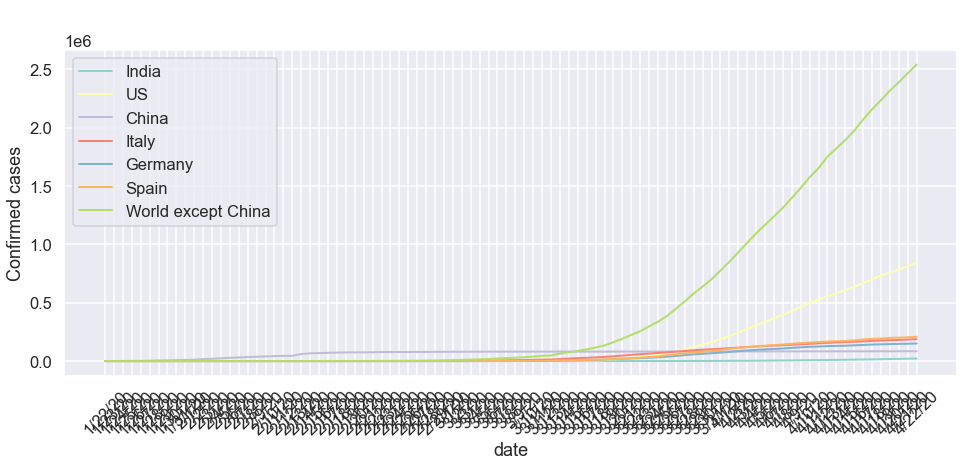

In [240]:
fig, ax = plt.subplots(figsize=(16, 6))

sns.lineplot(x=covid_India['date'], y=covid_India['confirmed'], sort=False, linewidth=2)
sns.lineplot(x=covid_US['date'], y=covid_US['confirmed'], sort=False, linewidth=2)
sns.lineplot(x=covid_China['date'], y=covid_China['confirmed'], sort=False, linewidth=2)
sns.lineplot(x=covid_Italy['date'], y=covid_Italy['confirmed'], sort=False, linewidth=2)
sns.lineplot(x=covid_Germany['date'], y=covid_Germany['confirmed'], sort=False, linewidth=2)
sns.lineplot(x=covid_Spain['date'], y=covid_Spain['confirmed'], sort=False, linewidth=2)
sns.lineplot(x=covid_no_China['date'], y=covid_no_China['confirmed'], sort=False, linewidth=2)

plt.suptitle("COVID-19 per country cases over the time", fontsize=16, fontweight='bold', color='white')

plt.xticks(rotation=45)
plt.ylabel('Confirmed cases')
ax.legend(['India', 'US', 'China', 'Italy', 'Germany', 'Spain', 'World except China'])

plt.show()

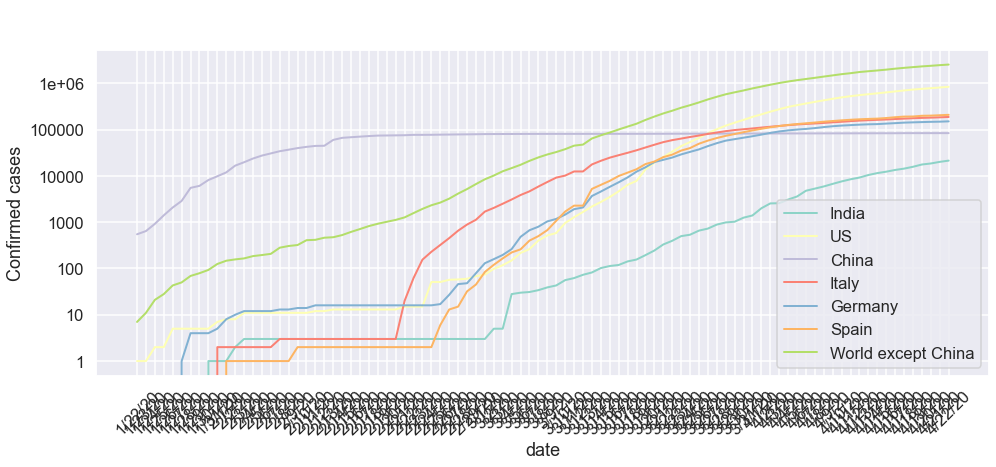

In [241]:
fig, ax = plt.subplots(figsize=(16, 6))
ax.set(yscale="log")
ax.yaxis.set_major_formatter(ticker.FuncFormatter(lambda y, _: '{:g}'.format(y)))

sns.lineplot(x=covid_India['date'], y=covid_India['confirmed'], sort=False, linewidth=2)
sns.lineplot(x=covid_US['date'], y=covid_US['confirmed'], sort=False, linewidth=2)
sns.lineplot(x=covid_China['date'], y=covid_China['confirmed'], sort=False, linewidth=2)
sns.lineplot(x=covid_Italy['date'], y=covid_Italy['confirmed'], sort=False, linewidth=2)
sns.lineplot(x=covid_Germany['date'], y=covid_Germany['confirmed'], sort=False, linewidth=2)
sns.lineplot(x=covid_Spain['date'], y=covid_Spain['confirmed'], sort=False, linewidth=2)
sns.lineplot(x=covid_no_China['date'], y=covid_no_China['confirmed'], sort=False, linewidth=2)

plt.suptitle("COVID-19 per country cases over the time", fontsize=16, fontweight='bold', color='white')
plt.title("(logarithmic scale)", color='white')

plt.xticks(rotation=45)
plt.ylabel('Confirmed cases')
ax.legend(['India', 'US', 'China', 'Italy', 'Germany', 'Spain', 'World except China'])

plt.show()

## Analyzing select countries

In [242]:
def plot_country_global_info(country):# Get the no of confirmed, recovered and death cases in a country using treemap
    country_info = covid_countries_df[covid_countries_df['Country/Region'] == country]
    
    country_info_long = country_info.melt(value_vars=['active', 'deaths', 'recovered'],
                                          var_name="status",
                                          value_name="count")

    country_info_long['upper'] = 'Confirmed cases'
    
    fig = px.treemap(country_info_long, path=["upper", "status"], values="count",
                     title=f"Total COVID-19 confirmed cases in {country}",
                     color_discrete_sequence=['#EFFF00', '#11FF00', '#FF0022'],
                     template='plotly_dark')

    fig.data[0].textinfo = 'label+text+value'

    fig.show()

def plot_country_cases_over_time(country, log): # Time series analysis of the country
    country_date_info = covid_countries_date_df[covid_countries_date_df['Country/Region'] == country]
    
    fig, ax = plt.subplots(figsize=(16, 6))

    if log:
        ax.set(yscale="log")
        ax.yaxis.set_major_formatter(ticker.FuncFormatter(lambda y, _: '{:g}'.format(y)))
        plt.title("(logarithmic scale)", color='white')

    sns.lineplot(x=country_date_info['date'], y=country_date_info['confirmed'], sort=False, linewidth=2)
    sns.lineplot(x=country_date_info['date'], y=country_date_info['deaths'], sort=False, linewidth=2)
    sns.lineplot(x=country_date_info['date'], y=country_date_info['recovered'], sort=False, linewidth=2)
    sns.lineplot(x=country_date_info['date'], y=country_date_info['active'], sort=False, linewidth=2)
                
    ax.lines[0].set_linestyle("--")

    plt.suptitle(f"COVID-19 cases in {country} over the time", fontsize=16, fontweight='bold', color='white')

    plt.xticks(rotation=45)
    plt.ylabel('Number of cases')

    ax.legend(['Confirmed', 'Deaths', 'Recovered', 'Active'])

    plt.show()

def plot_province_cases(country): # Display province distribution using treemap
    covid_provinces_df = covid_df.groupby(['Province/State', 'Country/Region']).max().reset_index()
    
    country_provinces_info = covid_provinces_df[covid_provinces_df['Country/Region'] == country]
    
    has_provinces = country_provinces_info.shape[0] > 1
    
    if (has_provinces):
        country_info_long = country_provinces_info.melt(id_vars=['Province/State'],
                                                        value_vars=['active', 'deaths', 'recovered'],
                                                        var_name="status",
                                                        value_name="count")

        country_info_long['upper'] = 'Confirmed cases'

        fig = px.treemap(country_info_long, path=['upper', "Province/State", "status"],
                         values="count",
                         title=f"Number of COVID-19 confirmed cases per Province/State in {country}",
                         template='plotly_dark')
        
        fig.data[0].textinfo = 'label+text+value'

        fig.show()

def get_country_covid_info(country, log=False):
    plot_country_global_info(country)
    
    plot_country_cases_over_time(country, log)
    
    plot_province_cases(country)

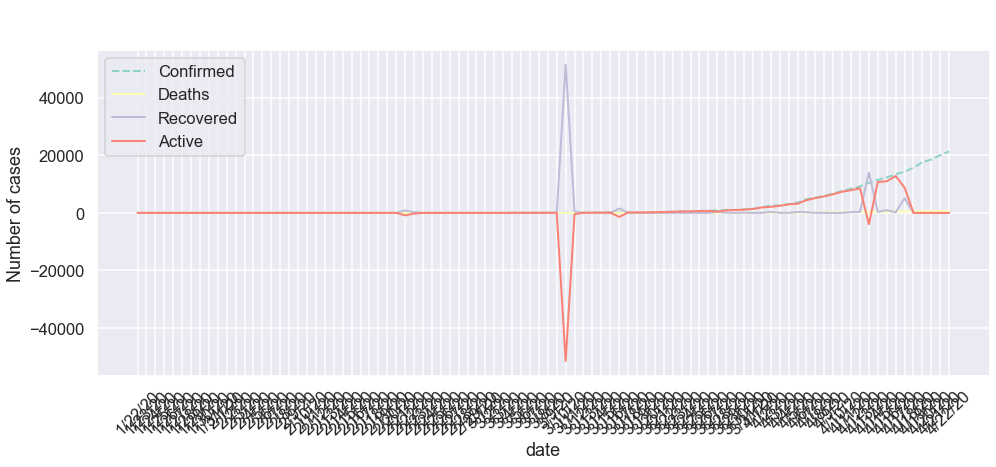

In [243]:
get_country_covid_info('India')

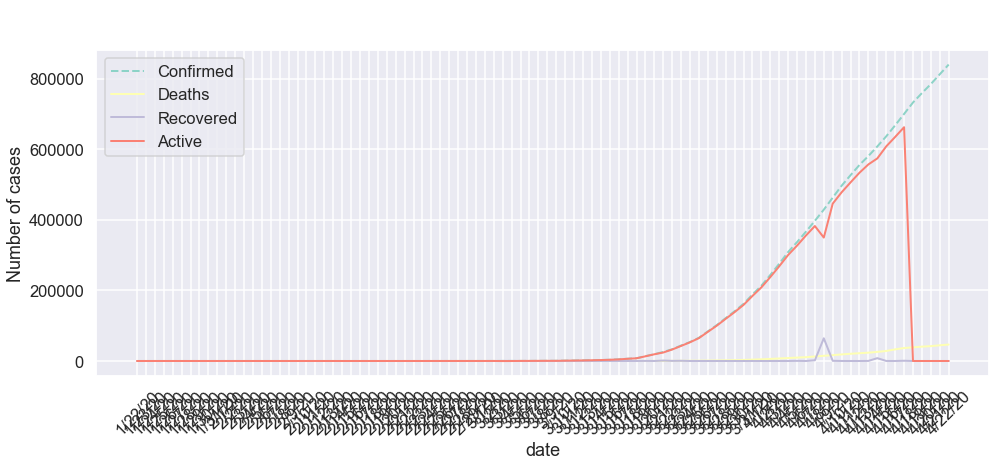

In [244]:
get_country_covid_info('US')

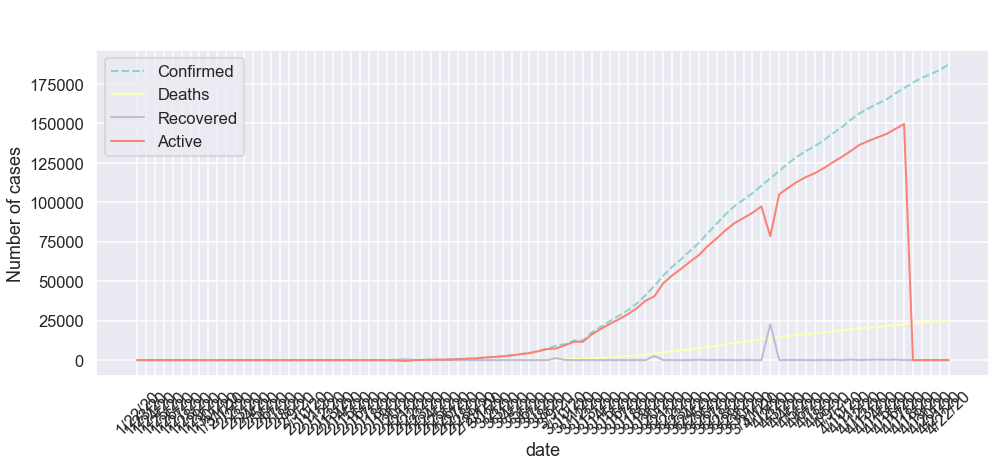

In [245]:
get_country_covid_info('Italy')

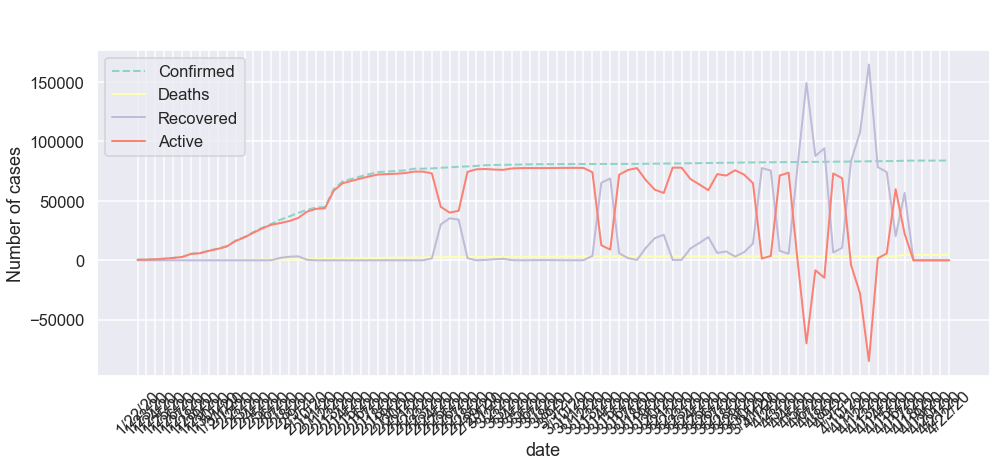

In [246]:
get_country_covid_info('China')

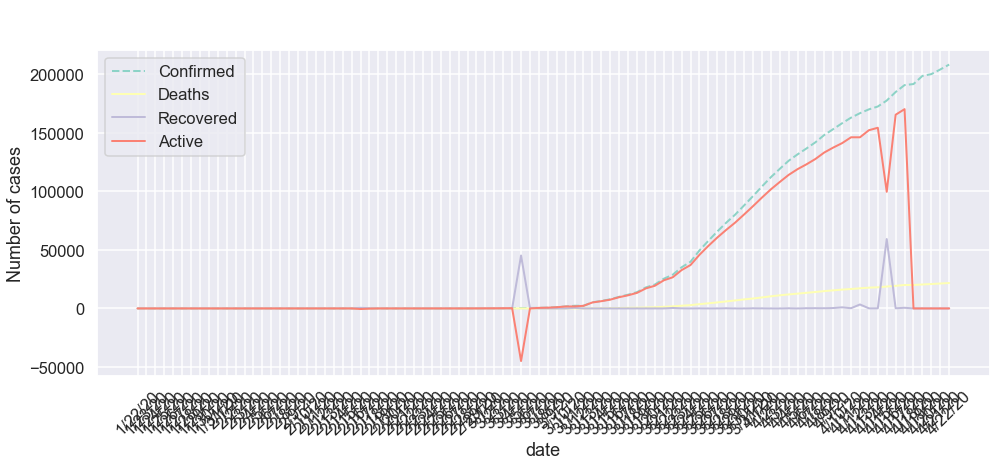

In [247]:
get_country_covid_info('Spain')

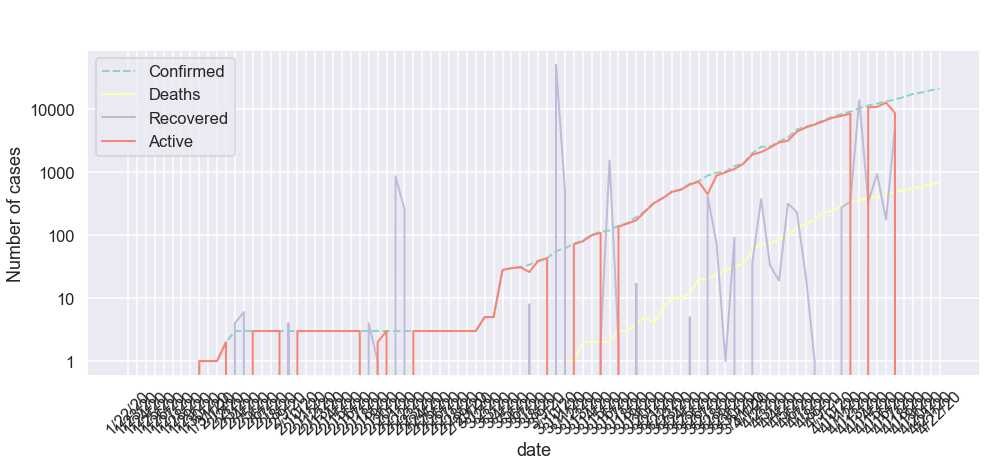

In [248]:
get_country_covid_info('India', log=True)

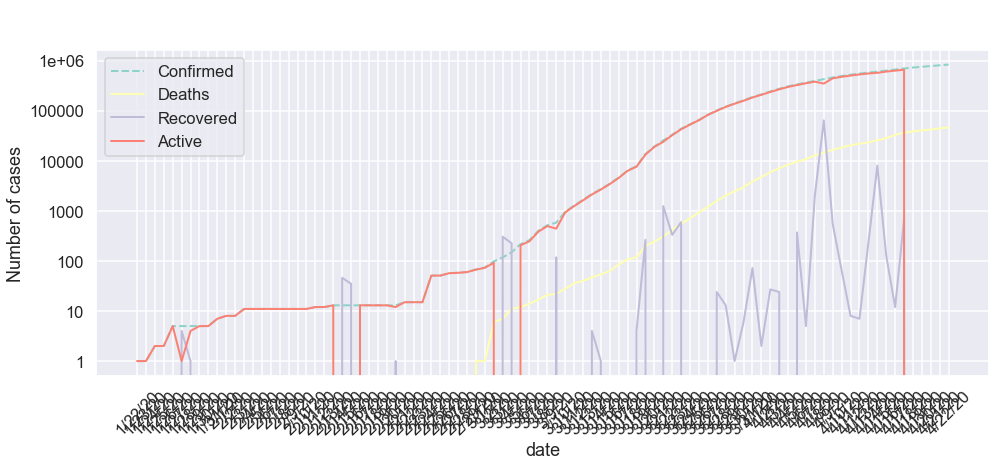

In [249]:
get_country_covid_info('US', log=True)

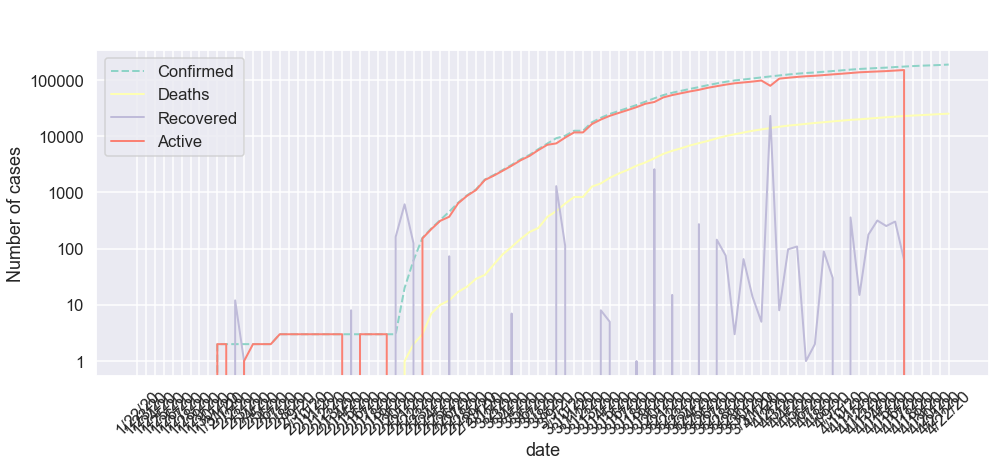

In [250]:
get_country_covid_info('Italy', log=True)

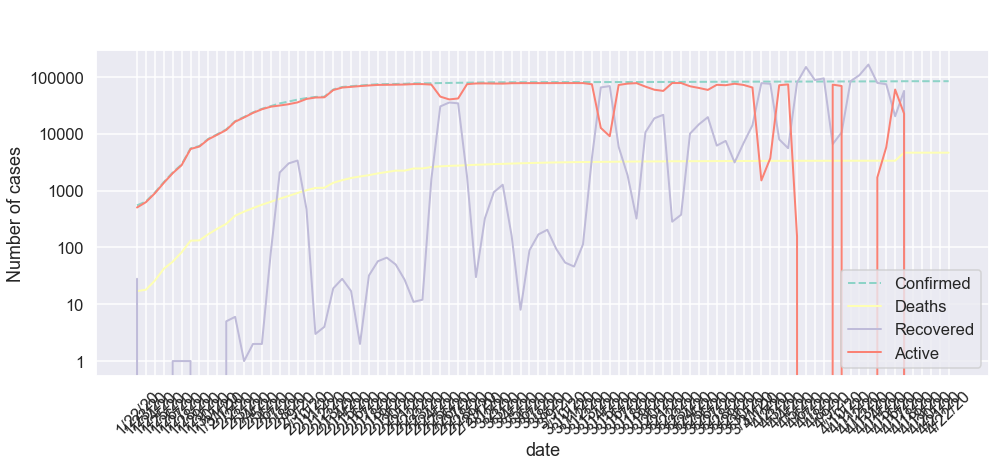

In [251]:
get_country_covid_info('China', log=True)

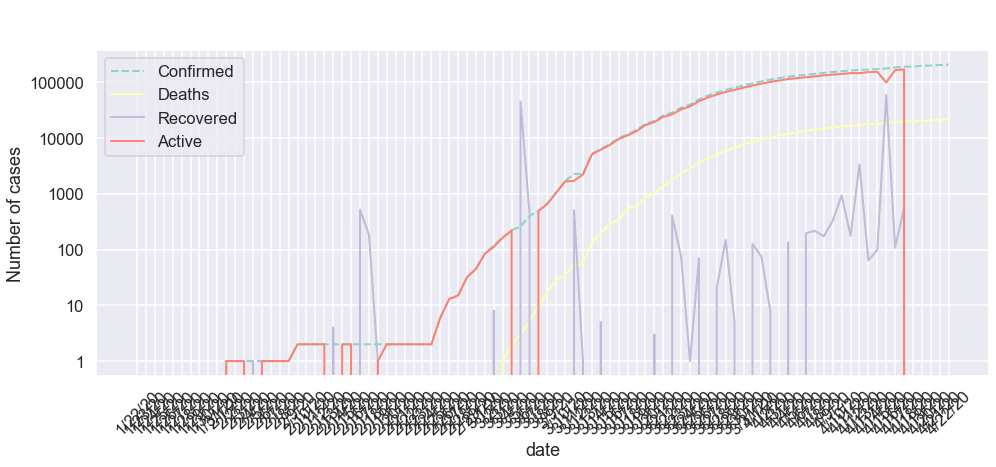

In [252]:
get_country_covid_info('Spain', log=True)

# Part 3

Convert data to long format:

In [253]:
covid_confirmed_long = pd.melt(covid_confirmed,
                               id_vars=covid_confirmed.iloc[:, :4],
                               var_name='date',
                               value_name='confirmed')
covid_confirmed_long.shape

(24288, 6)

In [254]:
covid_confirmed_long.head()

,Province/State,Country/Region,Lat,Long,date,confirmed
0,,Afghanistan,33.0000,65.0000,1/22/20,0
1,,Albania,41.1533,20.1683,1/22/20,0
2,,Algeria,28.0339,1.6596,1/22/20,0
3,,Andorra,42.5063,1.5218,1/22/20,0
4,,Angola,-11.2027,17.8739,1/22/20,0


In [255]:
covid_confirmed_long['Country/Region'].replace('Mainland China', 'China', inplace=True)
covid_confirmed_long[['Province/State']] = covid_confirmed_long[['Province/State']].fillna('')
covid_confirmed_long.fillna(0, inplace=True)
covid_confirmed_long.isna().sum().sum()

0

## Country wise analysis over time

In [256]:
covid_countries_date_df = covid_confirmed_long.groupby(['Country/Region', 'date'], sort=False).sum().reset_index()
covid_countries_date_df.drop(['Lat', 'Long'], axis=1, inplace=True)
covid_countries_date_df

,Country/Region,date,confirmed
0,Afghanistan,1/22/20,0
1,Albania,1/22/20,0
2,Algeria,1/22/20,0
3,Andorra,1/22/20,0
4,Angola,1/22/20,0
...,...,...,...
17015,Malawi,4/22/20,23
17016,South Sudan,4/22/20,4
17017,Western Sahara,4/22/20,6
17018,Sao Tome and Principe,4/22/20,4


In [257]:
covid_country = covid_countries_date_df[covid_countries_date_df['Country/Region'] == 'India']
covid_country.head()

,Country/Region,date,confirmed
71,India,1/22/20,0
256,India,1/23/20,0
441,India,1/24/20,0
626,India,1/25/20,0
811,India,1/26/20,0


In [258]:
COUNTRY='US'
covid_country = covid_countries_date_df[covid_countries_date_df['Country/Region'] == COUNTRY]
covid_country.head()

,Country/Region,date,confirmed
156,US,1/22/20,1
341,US,1/23/20,1
526,US,1/24/20,2
711,US,1/25/20,2
896,US,1/26/20,5


In [259]:
days = np.array([i for i in range(len(covid_country['date']))])
days

array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
       17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33,
       34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50,
       51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67,
       68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84,
       85, 86, 87, 88, 89, 90, 91])

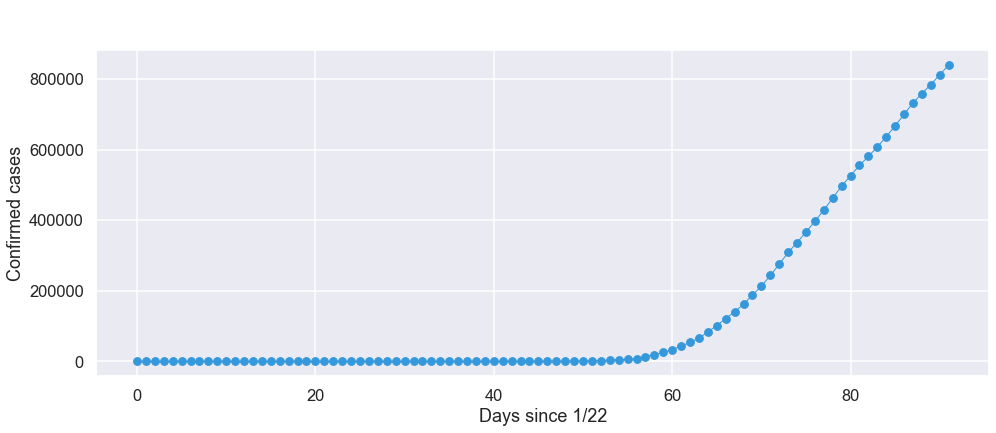

In [260]:
fig, ax = plt.subplots(figsize=(16, 6))

sns.lineplot(x=days, y=covid_country['confirmed'],
             markeredgecolor="#3498db", markerfacecolor="#3498db", markersize=8, marker="o",
             sort=False, linewidth=1, color="#3498db")

plt.suptitle(f"COVID-19 confirmed cases in {COUNTRY} over the time", fontsize=16, fontweight='bold', color='white')

plt.ylabel('Confirmed cases')
plt.xlabel('Days since 1/22')
plt.show()

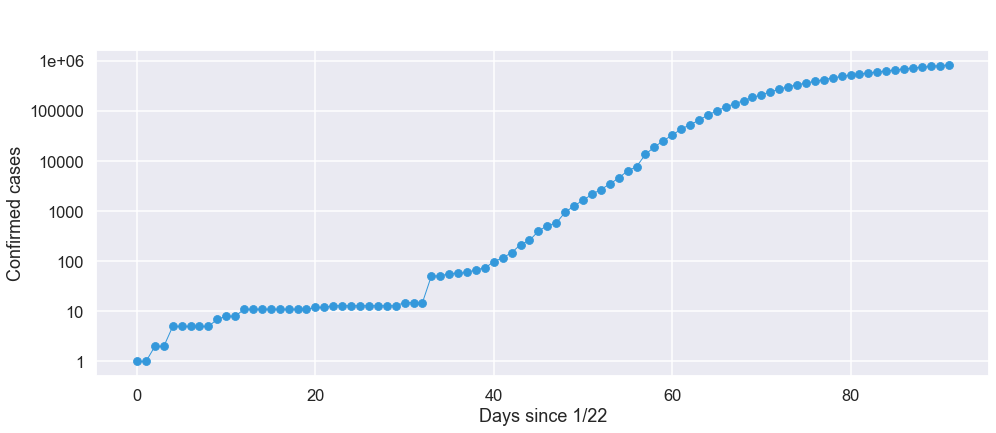

In [261]:
fig, ax = plt.subplots(figsize=(16, 6))

ax.set(yscale="log")
ax.yaxis.set_major_formatter(ticker.FuncFormatter(lambda y, _: '{:g}'.format(y)))
plt.title("(logarithmic scale)", color='white')

sns.lineplot(x=days, y=covid_country['confirmed'],
             markeredgecolor="#3498db", markerfacecolor="#3498db", markersize=8, marker="o",
             sort=False, linewidth=1, color="#3498db")

plt.suptitle(f"COVID-19 confirmed cases in {COUNTRY} over the time", fontsize=16, fontweight='bold', color='white')

plt.ylabel('Confirmed cases')
plt.xlabel('Days since 1/22')

plt.show()

In [262]:
# Skip the first four weeks
SKIP_DAYS = 30
covid_country_confirmed_sm = list(covid_country['confirmed'][SKIP_DAYS:])
covid_country_confirmed_sm[:15]

[15, 15, 15, 51, 51, 57, 58, 60, 68, 74, 98, 118, 149, 217, 262]

In [263]:
X = days[SKIP_DAYS:].reshape(-1, 1)

X

array([[30],
       [31],
       [32],
       [33],
       [34],
       [35],
       [36],
       [37],
       [38],
       [39],
       [40],
       [41],
       [42],
       [43],
       [44],
       [45],
       [46],
       [47],
       [48],
       [49],
       [50],
       [51],
       [52],
       [53],
       [54],
       [55],
       [56],
       [57],
       [58],
       [59],
       [60],
       [61],
       [62],
       [63],
       [64],
       [65],
       [66],
       [67],
       [68],
       [69],
       [70],
       [71],
       [72],
       [73],
       [74],
       [75],
       [76],
       [77],
       [78],
       [79],
       [80],
       [81],
       [82],
       [83],
       [84],
       [85],
       [86],
       [87],
       [88],
       [89],
       [90],
       [91]])

In [264]:
y = list(np.log(covid_country_confirmed_sm))

y

[2.70805020110221,
 2.70805020110221,
 2.70805020110221,
 3.9318256327243257,
 3.9318256327243257,
 4.04305126783455,
 4.060443010546419,
 4.0943445622221,
 4.219507705176107,
 4.30406509320417,
 4.584967478670572,
 4.770684624465665,
 5.003946305945459,
 5.37989735354046,
 5.568344503761097,
 5.996452088619021,
 6.249975242259483,
 6.368187186350492,
 6.8658910748834385,
 7.155396301896734,
 7.416378479192928,
 7.68662133494462,
 7.910957382845589,
 8.160232492367689,
 8.440744019252831,
 8.76732914779405,
 8.959697146959389,
 9.52857589747142,
 9.866460431699052,
 10.150347630467653,
 10.412591695403778,
 10.68837034993756,
 10.8918384469467,
 11.094040714902595,
 11.33661778849305,
 11.529359680433648,
 11.707381434420183,
 11.85586957093556,
 11.994307859815821,
 12.145111717169032,
 12.270182949996071,
 12.40337312272686,
 12.525860032388957,
 12.639963227822042,
 12.727250499574957,
 12.811254357736402,
 12.891996299125749,
 12.968405345685898,
 13.0450070581561,
 13.115409253436

In [265]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.1, shuffle=False)

## Builiding a Machine Learning Model

In [266]:
linear_model = LinearRegression(fit_intercept=True)

linear_model.fit(X_train, y_train)

LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=False)

In [267]:
y_pred = linear_model.predict(X_test)

y_pred

array([15.07675927, 15.29771604, 15.51867282, 15.73962959, 15.96058636,
       16.18154314, 16.40249991])

In [268]:
print('MAE:', mean_absolute_error(y_pred, y_test))
print('MSE:',mean_squared_error(y_pred, y_test))

MAE: 2.206228382366072
MSE: 5.001861751540198


### Forecasting the next two weeks

In [269]:
# y = ax + b
a = linear_model.coef_
b = linear_model.intercept_

In [270]:
X_fore = list(np.arange(len(days), len(days) + 14))
y_fore = [(a*x+b)[0] for x in X_fore]

X_fore, y_fore

([92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105],
 [16.623456683036036,
  16.844413456522883,
  17.065370230009727,
  17.28632700349657,
  17.507283776983417,
  17.72824055047026,
  17.949197323957108,
  18.17015409744395,
  18.391110870930795,
  18.612067644417642,
  18.833024417904486,
  19.053981191391333,
  19.274937964878177,
  19.49589473836502])

In [271]:
y_train_l = list(np.exp(y_train))
y_test_l = list(np.exp(y_test))
y_pred_l = list(np.exp(y_pred))
y_fore_l = list(np.exp(y_fore))

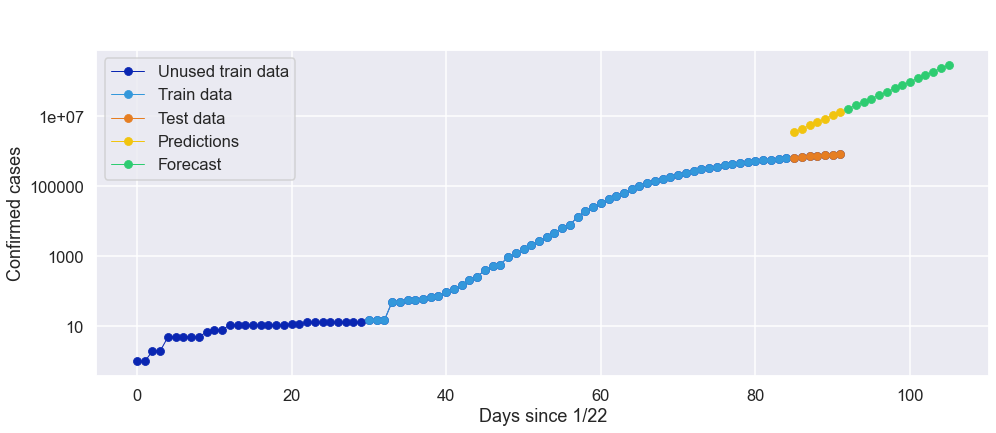

In [276]:
fig, ax = plt.subplots(figsize=(16, 6))

ax.set(yscale="log")
ax.yaxis.set_major_formatter(ticker.FuncFormatter(lambda y, _: '{:g}'.format(y)))
plt.title("(logarithmic scale)", color='white')

sns.lineplot(x=days, y=covid_country['confirmed'],
             markeredgecolor="#0A26B2", markerfacecolor="#0A26B2", markersize=8, marker="o",
             sort=False, linewidth=1, color="#0A26B2")

sns.lineplot(x=X_train.reshape(-1), y=y_train_l,
             markeredgecolor="#3498db", markerfacecolor="#3498db", markersize=8, marker="o",
             sort=False, linewidth=1, color="#3498db")

sns.lineplot(x=X_test.reshape(-1), y=y_test_l,
             markeredgecolor="#e67e22", markerfacecolor="#e67e22", markersize=8, marker="o",
             sort=False, linewidth=1, color="#e67e22")

sns.lineplot(x=X_test.reshape(-1), y=y_pred_l,
             markeredgecolor="#f1c40f", markerfacecolor="#f1c40f", markersize=8, marker="o",
             sort=False, linewidth=1, color="#f1c40f")

sns.lineplot(x=X_fore, y=y_fore_l,
             markeredgecolor="#2ecc71", markerfacecolor="#2ecc71", markersize=8, marker="o",
             sort=False, linewidth=1, color="#2ecc71")

plt.suptitle(f"COVID-19 confirmed cases and forecasting in {COUNTRY} over the time", fontsize=16, fontweight='bold', color='white')

plt.ylabel('Confirmed cases')
plt.xlabel('Days since 1/22')

plt.legend(['Unused train data', 'Train data', 'Test data', 'Predictions', 'Forecast'])

plt.show()

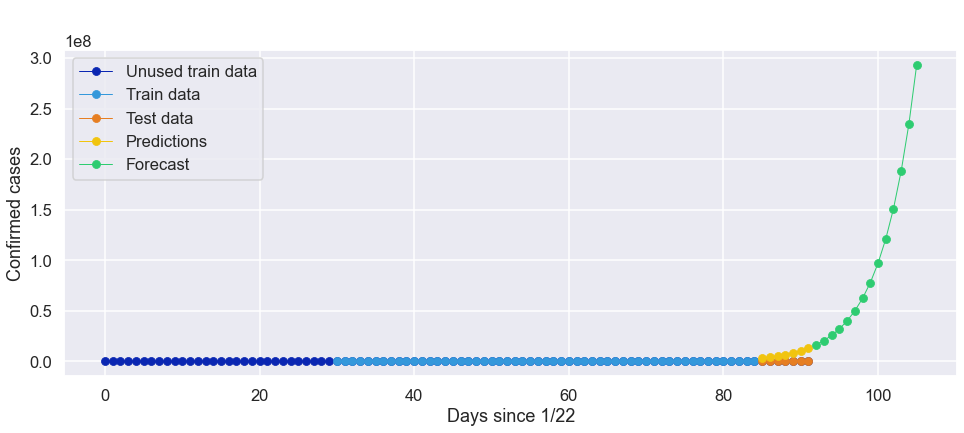

In [277]:
fig, ax = plt.subplots(figsize=(16, 6))

sns.lineplot(x=days, y=covid_country['confirmed'],
             markeredgecolor="#0A26B2", markerfacecolor="#0A26B2", markersize=8, marker="o",
             sort=False, linewidth=1, color="#0A26B2")

sns.lineplot(x=X_train.reshape(-1), y=y_train_l,
             markeredgecolor="#3498db", markerfacecolor="#3498db", markersize=8, marker="o",
             sort=False, linewidth=1, color="#3498db")

sns.lineplot(x=X_test.reshape(-1), y=y_test_l,
             markeredgecolor="#e67e22", markerfacecolor="#e67e22", markersize=8, marker="o",
             sort=False, linewidth=1, color="#e67e22")

sns.lineplot(x=X_test.reshape(-1), y=y_pred_l,
             markeredgecolor="#f1c40f", markerfacecolor="#f1c40f", markersize=8, marker="o",
             sort=False, linewidth=1, color="#f1c40f")

sns.lineplot(x=X_fore, y=y_fore_l,
             markeredgecolor="#2ecc71", markerfacecolor="#2ecc71", markersize=8, marker="o",
             sort=False, linewidth=1, color="#2ecc71")

plt.suptitle(f"COVID-19 confirmed cases and forecasting in {COUNTRY} over the time", fontsize=16, fontweight='bold', color='white')

plt.ylabel('Confirmed cases')
plt.xlabel('Days since 1/22')

plt.legend(['Unused train data', 'Train data', 'Test data', 'Predictions', 'Forecast'])
plt.savefig('reg.svg', format='svg', dpi=1200)
plt.show()